<a href="https://colab.research.google.com/github/in123-new/initialProject/blob/main/P2_TIM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## TP N°2: Filtrage spatial et fréquentiel des images numériques

In [ ]:
from google.colab import drive
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import cmath
from google.colab.patches import cv2_imshow
import skimage.measure as skm
import scipy.misc
from scipy import ndimage
from skimage.util import random_noise
import random

In [ ]:
drive.mount('/content/gdrive')

IMGS_PATH = 'gdrive/MyDrive/TP_TIM_IMAGES'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Partie 01: Filtrage spatial

**Manipulation 01: Réduction du bruit**

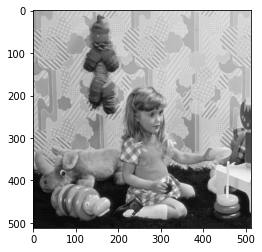

In [ ]:
# Instruction 01

img = cv.imread(IMGS_PATH + "/isabelle.bmp", 0)
plt.imshow(img, cmap="gray")

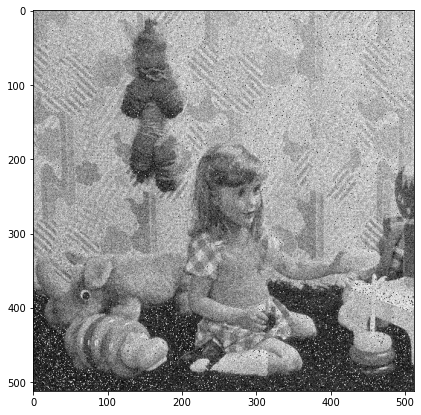

In [ ]:
# Instruction 02

plt.figure(figsize=(7, 7))

mean_noise = 0
std_dev_noise = 25

gaussian_noise = np.random.normal(mean_noise, std_dev_noise, img.shape)

img_noised = (img + gaussian_noise).astype(np.uint8)
plt.imshow(img_noised.astype(np.uint8), cmap="gray")

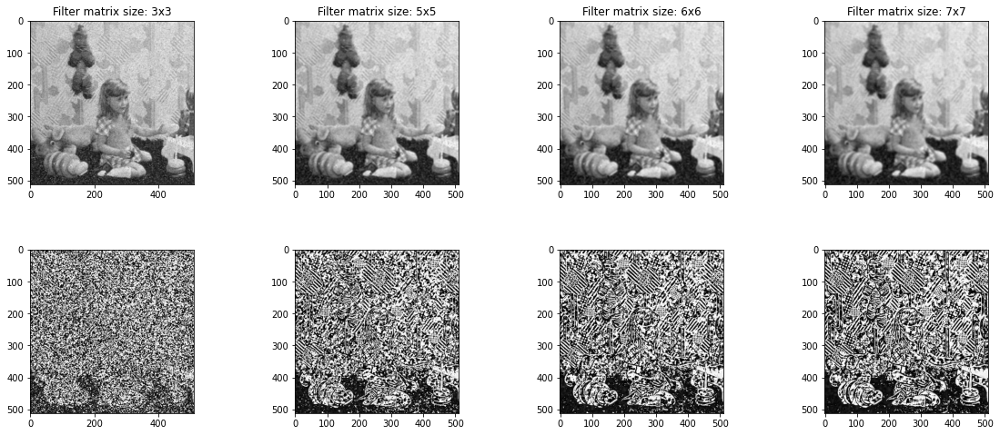

In [ ]:
# Instruction 2-A: Filtre moyenneur

plt.figure(figsize = (20, 20))
plt.subplots_adjust(left = 0.125, right = 0.9, bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 6, 7]
mean_fil_imgs = []

for i in range(len(filter_dims)):
    plt.subplot(2, 4, i+1)
    mean_fil_imgs.append(cv.blur(img_noised, (filter_dims[i], filter_dims[i])))
    plt.imshow(mean_fil_imgs[i], cmap="gray")
    plt.title("Filter matrix size: " + str(filter_dims[i]) + "x" + str(filter_dims[i]))

for i in range(len(filter_dims)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow(mean_fil_imgs[i] - img, cmap="gray")

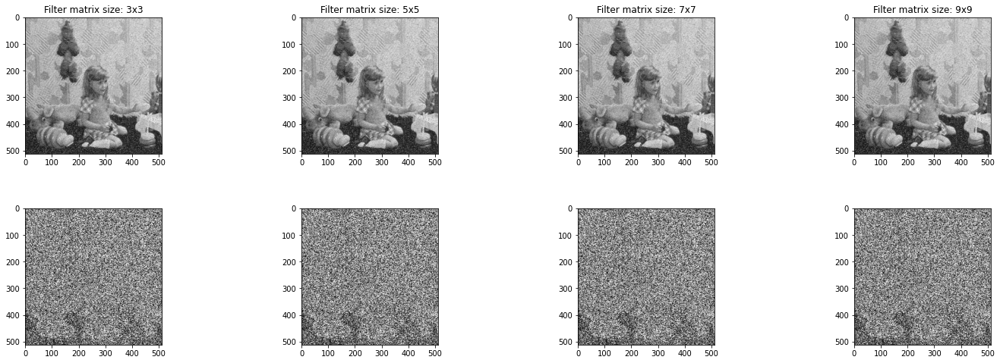

In [ ]:
# Instruction 2-B: Filtre gaussien

plt.figure(figsize = (25, 20))
plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 7, 9]
gauss_fil_imgs = []

for i in range(len(filter_dims)):
    plt.subplot(2, 4, i+1)
    gauss_fil_imgs.append(cv.GaussianBlur(img_noised, (filter_dims[i], filter_dims[i]), 0.5))
    plt.imshow(gauss_fil_imgs[i], cmap="gray")
    plt.title("Filter matrix size: " + str(filter_dims[i]) + "x" + str(filter_dims[i]))

for i in range(len(filter_dims)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow(gauss_fil_imgs[i] - img, cmap="gray")

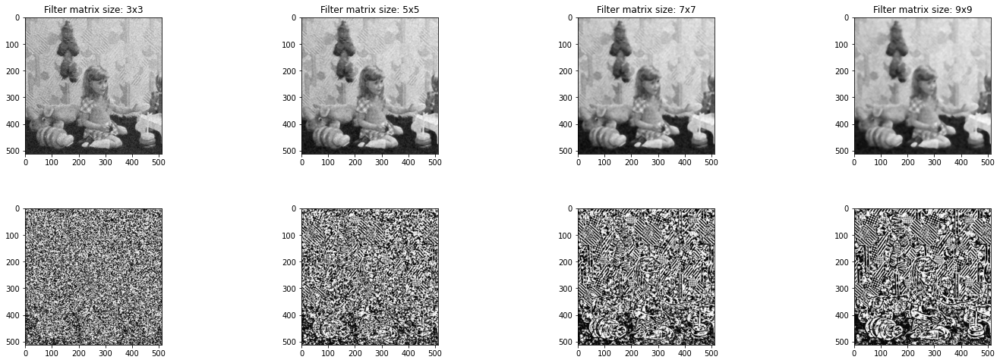

In [ ]:
# Instruction 2-C: Filtre médian

plt.figure(figsize = (25, 20))
plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 7, 9]
med_fil_imgs = []

for i in range(len(filter_dims)):
    plt.subplot(2, 4, i+1)
    med_fil_imgs.append(cv.medianBlur(img_noised, filter_dims[i], filter_dims[i]))
    plt.imshow(med_fil_imgs[i], cmap="gray")
    plt.title("Filter matrix size: " + str(filter_dims[i]) + "x" + str(filter_dims[i]))

for i in range(len(filter_dims)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow(med_fil_imgs[i] - img, cmap="gray")

*Instruction 03: Comparaison*

On remarque que le filtre moyenneur fait un assez bon travail à réduire le bruit, mais qu'il nous fait perdre bcp de détails au niveau des contours causant un floutage de l'image comme on peut le voir dans les images représentant la différence entre l'image bruitée et l'image filtrée.

Le filtre gaussien fait une réduction de bruit encore meilleur tout en évitant de flouter l'image autant que le filtre moyenneur, ce qui se voit dans les images représentant la différence entre l'image bruitée et l'image filtrée.

Le filtre médian élimine le bruit assez bien, malgré qu'il est plus adapté aux bruits poivre et sel en général.


In [ ]:
# Instruction 04

def salt_pepper_noise(img, perc):
    im = img.copy()
    row , col = im.shape
     
    number_of_pixels = int(np.round(row * col * perc))

    for i in range(number_of_pixels):
        y_coord=random.randint(0, row - 1)
        x_coord=random.randint(0, col - 1)

        im[y_coord][x_coord] = random.choice([0, 255])
         
    return im

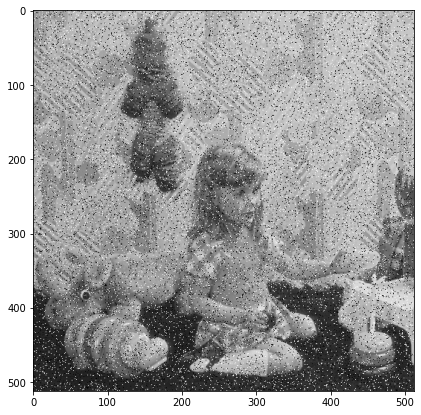

In [ ]:
plt.figure(figsize=(7, 7))

img_noised = salt_pepper_noise(img, 0.1)

plt.imshow(img_noised, cmap="gray")

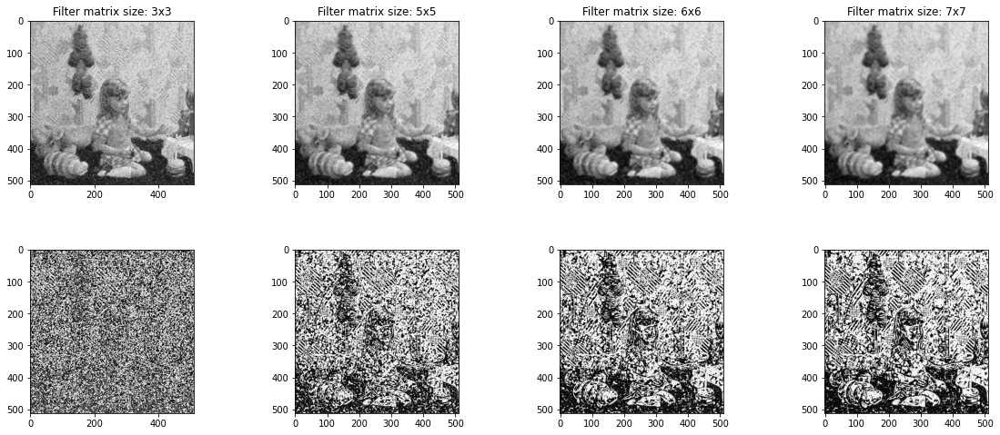

In [ ]:
# Instruction 4-A: Filtre moyenneur

plt.figure(figsize = (20, 20))
plt.subplots_adjust(left = 0.125, right = 0.9, bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 6, 7]
mean_fil_imgs = []

for i in range(len(filter_dims)):
    plt.subplot(2, 4, i+1)
    mean_fil_imgs.append(cv.blur(img_noised, (filter_dims[i], filter_dims[i])))
    plt.imshow(mean_fil_imgs[i], cmap="gray")
    plt.title("Filter matrix size: " + str(filter_dims[i]) + "x" + str(filter_dims[i]))

for i in range(len(filter_dims)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow(mean_fil_imgs[i] - img, cmap="gray")

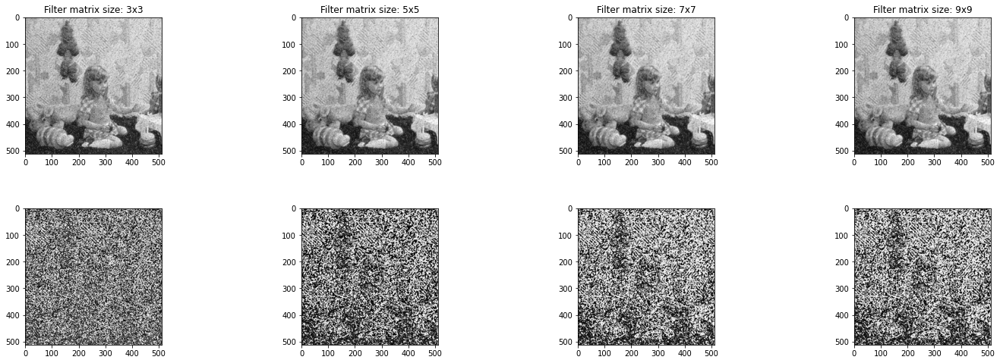

In [ ]:
# Instruction 4-B: Filtre gaussien

plt.figure(figsize = (25, 20))
plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 7, 9]
gauss_fil_imgs = []

for i in range(len(filter_dims)):
    plt.subplot(2, 4, i+1)
    gauss_fil_imgs.append(cv.GaussianBlur(img_noised, (filter_dims[i], filter_dims[i]), 1))
    plt.imshow(gauss_fil_imgs[i], cmap="gray")
    plt.title("Filter matrix size: " + str(filter_dims[i]) + "x" + str(filter_dims[i]))

for i in range(len(filter_dims)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow(gauss_fil_imgs[i] - img, cmap="gray")

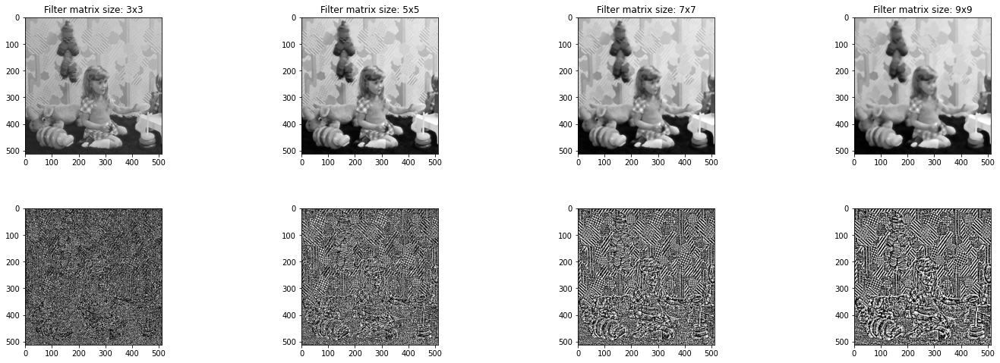

In [ ]:
# Instruction 4-C: Filtre médian

plt.figure(figsize = (25, 20))
plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 7, 9]
med_fil_imgs = []

for i in range(len(filter_dims)):
    plt.subplot(2, 4, i+1)
    med_fil_imgs.append(cv.medianBlur(img_noised, filter_dims[i], filter_dims[i]))
    plt.imshow(med_fil_imgs[i], cmap="gray")
    plt.title("Filter matrix size: " + str(filter_dims[i]) + "x" + str(filter_dims[i]))

for i in range(len(filter_dims)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow(med_fil_imgs[i] - img, cmap="gray")

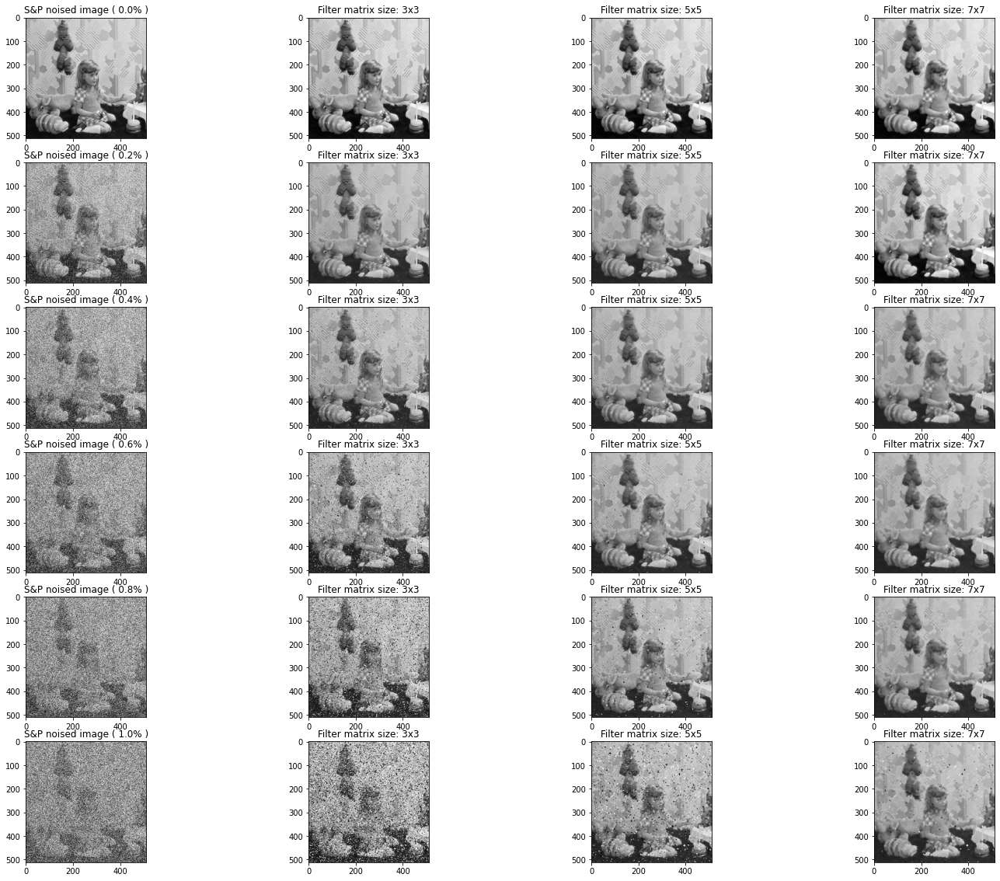

In [ ]:
# Instruction 05

plt.figure(figsize = (25, 20))
# plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dims = [3, 5, 7]
med_fil_imgs = []

n = 5

for i in range(n+1):
    img_noised = salt_pepper_noise(img, i/n)

    plt.subplot(n+1, len(filter_dims) + 1, i * (len(filter_dims) + 1) + 1)
    plt.title("S&P noised image ( " + str(i/n) + "% )")
    plt.imshow(img_noised, cmap="gray")

    med_fil_imgs = []
    for j in range(len(filter_dims)):
        med_fil_imgs.append(cv.medianBlur(img_noised, filter_dims[j], filter_dims[j]))
        plt.subplot(n+1, len(filter_dims) + 1, i * (len(filter_dims) + 1) + j + 2)
        plt.imshow(med_fil_imgs[j], cmap="gray")
        plt.title("Filter matrix size: " + str(filter_dims[j]) + "x" + str(filter_dims[j]))

On remarque que le filtre médian est très efficace dans l'élimination du bruit impulsionnel sur l'image et permet de récupérer pratiquement toute l'image pour un bruit à pratiquement 80% - 90% avec un filtre médian assez large (7x7). Après quoi l'efficacité décroit.

**Manipulation 2 : Détection de contours**

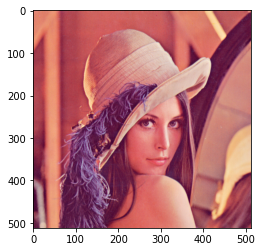

In [ ]:
# Instruction 01

img = cv.imread(IMGS_PATH + "/lena.png")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img)

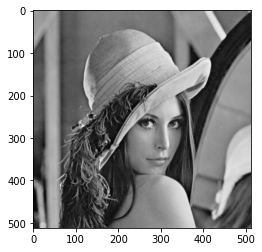

In [ ]:
# Instruction 02

img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
plt.imshow(img_gray, cmap="gray")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


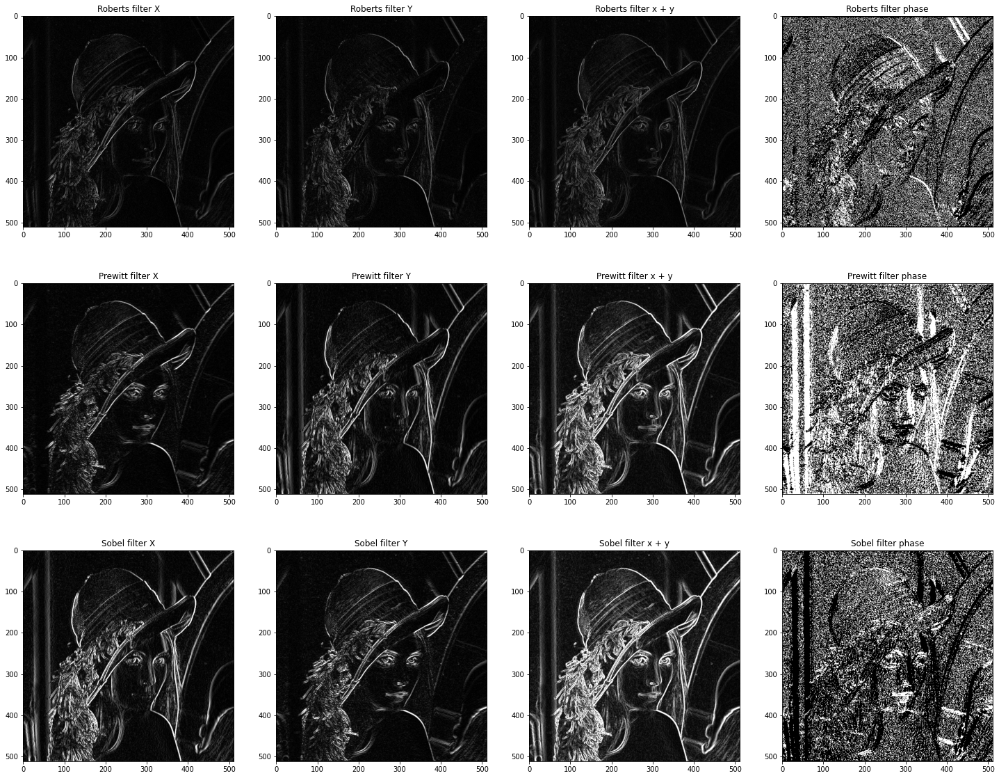

In [ ]:
# Instruction 03

plt.figure(figsize = (25, 20))

kernels = {
    'Roberts': {
        'kernelx': np.array([[-1, 0], [0, 1]], dtype=int),
        'kernely': np.array([[0, -1], [1, 0]], dtype=int),
    },

    'Prewitt': {
        'kernelx': np.array([[1,1,1],[0,0,0],[-1,-1,-1]],dtype=int),
        'kernely': np.array([[-1,0,1],[-1,0,1],[-1,0,1]],dtype=int),
    },

    'Sobel': '',
}

i = 0
for filter, kernel in kernels.items():
    if filter == 'Sobel':
        x = cv.Sobel(img_gray, cv.CV_16S, 1, 0)
        y = cv.Sobel(img_gray, cv.CV_16S, 0, 1)
    else:
        x = cv.filter2D(img_gray, cv.CV_16S, kernel['kernelx'])
        y = cv.filter2D(img_gray, cv.CV_16S, kernel['kernely']) 

    absX = cv.convertScaleAbs(x).astype(np.uint8)
    absY = cv.convertScaleAbs(y).astype(np.uint8)
    module = cv.addWeighted(absX, 1, absY, 1, 0)
    phase = np.arctan(absY / absX).astype(np.uint8)

    plt.subplot(3, 4, 4*i + 1)
    plt.imshow(absX, cmap="gray")
    plt.title(filter + ' filter X')

    plt.subplot(3, 4, 4*i + 2)
    plt.imshow(absY, cmap="gray")
    plt.title(filter + ' filter Y')

    plt.subplot(3, 4, 4*i + 3)
    plt.imshow(module, cmap="gray")
    plt.title(filter + ' filter x + y')

    plt.subplot(3, 4, 4*i + 4)
    plt.imshow(phase, cmap="gray")
    plt.title(filter + ' filter phase')

    i+=1

Comparaison:

Nous pouvons remarquer que les filtres rendent des contours de plus en plus solides dans l'ordre Roberts -> Prewitt -> Sobel.

Text(0.5, 1.0, 'Laplacian 8 connectedness filter')

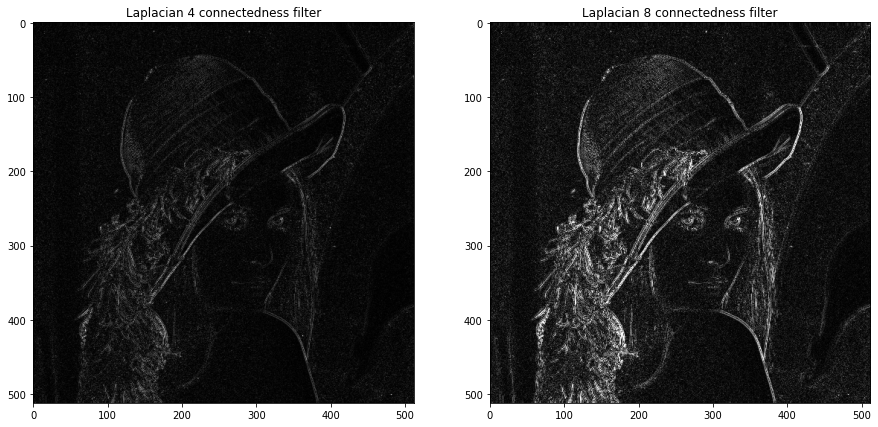

In [ ]:
# Instruction 04

plt.figure(figsize = (15, 15))

kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]],dtype=int)

dst = cv.filter2D(img_gray, cv.CV_16S, kernel)
Laplacian_4c = cv.convertScaleAbs(dst)

plt.subplot(1, 2, 1)
plt.imshow(Laplacian_4c, cmap="gray")
plt.title('Laplacian 4 connectedness filter')

kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]],dtype=int)

dst = cv.filter2D(img_gray, cv.CV_16S, kernel)
Laplacian_8c = cv.convertScaleAbs(dst)

plt.subplot(1, 2, 2)
plt.imshow(Laplacian_8c, cmap="gray")
plt.title('Laplacian 8 connectedness filter')

Comparaison:

Le filtre Laplacien 8 connexités définit mieux les contours de l'image que le Laplacien 4 connexités mais au dépend d'ajouter beaucoup de bruit.

Text(0.5, 1.0, 'Laplacian 8 connectedness filter on blurred image')

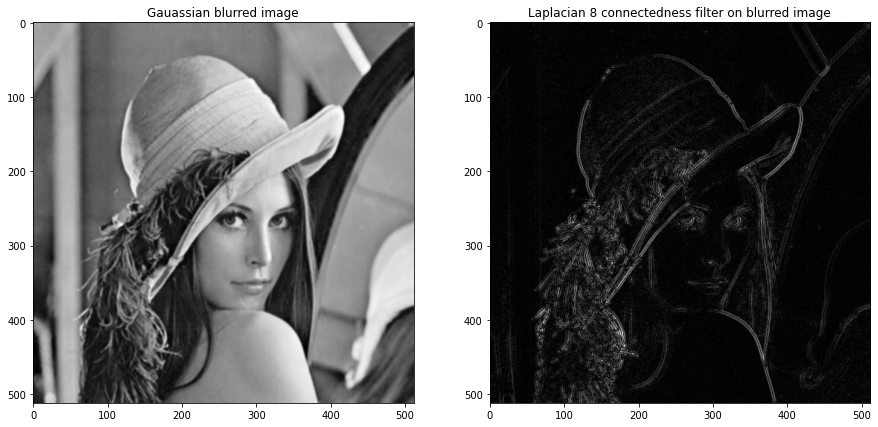

In [ ]:
# Instruction 05

plt.figure(figsize = (15, 15))

img_gauss_fil = cv.GaussianBlur(img_gray, (3, 3), 1)

plt.subplot(1, 2, 1)
plt.imshow(img_gauss_fil, cmap="gray")
plt.title('Gauassian blurred image')

kernel = np.array([[1,1,1],[1,-8,1],[1,1,1]],dtype=int)

dst = cv.filter2D(img_gauss_fil, cv.CV_16S, kernel)
Laplacian_8c = cv.convertScaleAbs(dst)

plt.subplot(1, 2, 2)
plt.imshow(Laplacian_8c, cmap="gray")
plt.title('Laplacian 8 connectedness filter on blurred image')

Text(0.5, 1.0, 'Laplacian 8 connectedness filter on blurred image')

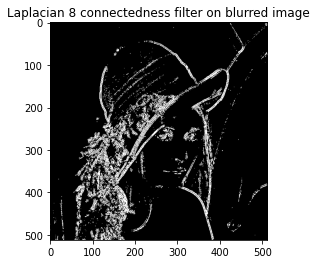

In [ ]:
# Instruction 06

th = 0

# On utilise l'option cv.THRESH_OTSU pour laisser l'algorithme choisir le meilleur seuil possible
ret, Lap_blur_th = cv.threshold(Laplacian_8c, th, 255, cv.THRESH_OTSU )
plt.imshow(Lap_blur_th, cmap="gray")
plt.title('Laplacian 8 connectedness filter on blurred image')

Instruction 07: Comparaison:

Lorsqu'on applique un filtrage Laplacien sur l'image traitée avec un filtre gaussien (floutée), on obtient un meilleur résultat qu'avec le Laplacien uniquement (on élimine le bruit produit), mais on obtient en revanche des contours "doublés" ou flous. Une fois qu'on applique un seuillage à ce résultat, nous obtenons un résultat très correct représentant fidèlement les contours de l'image, la difficulté de cette dernière opération réside dans le choix du seuil à utiliser. Heureusement, OpenCv nous permet de trouver le meilleur seuil automatiquement avec l'option cv.THRESH_OTSU

# Partie 02: Filtrage fréquentiel

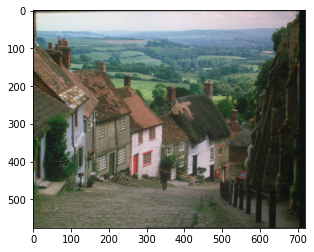

In [ ]:
# Instruction 01

img = cv.imread(IMGS_PATH + "/goldhill.bmp")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img)

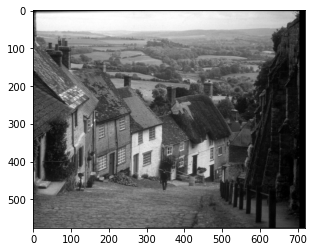

In [ ]:
# Instruction 02

img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
plt.imshow(img_gray, cmap="gray")

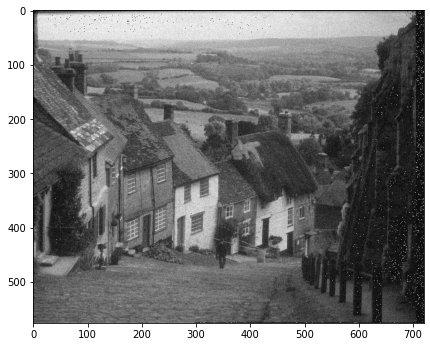

In [ ]:
# Instruction 03

plt.figure(figsize=(7, 7))

mean_noise = 0
std_dev_noise = 10

gaussian_noise = np.random.normal(mean_noise, std_dev_noise, img_gray.shape)

img_noised = (img_gray + gaussian_noise).astype(np.uint8)
plt.imshow(img_noised.astype(np.uint8), cmap="gray")

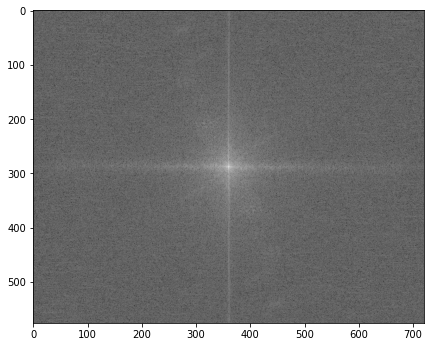

In [ ]:
# Instruction 04 & 05

plt.figure(figsize=(7, 7))

f = np.fft.fft2(img_noised)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift))

plt.imshow(magnitude_spectrum, cmap='gray')

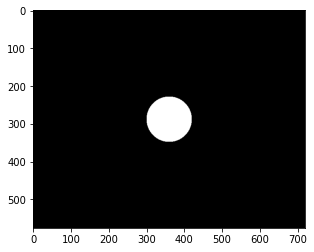

In [ ]:
# Instruction 06

nl, nc = img_noised.shape

D0 = 60
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H = z < D0

plt.imshow(H, cmap='gray')

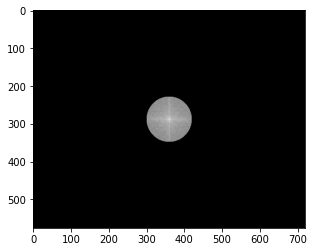

In [ ]:
# Instruction 07

filter_passe_bas = magnitude_spectrum * H

plt.imshow(filter_passe_bas, cmap='gray')

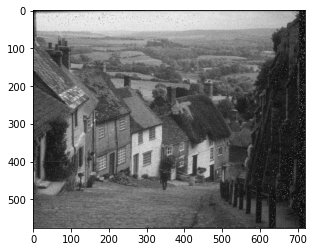

In [ ]:
# Instruction 08 & 09

f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back=np.uint8(img_back)

plt.imshow(img_back,cmap='gray')

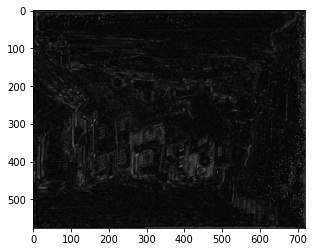

In [ ]:
# Instruction 10

nl, nc = img_noised.shape

D0 = 20
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H = z > D0

filter_passe_haut = magnitude_spectrum * H

f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back = np.uint8(img_back)

plt.imshow(img_back,cmap='gray')

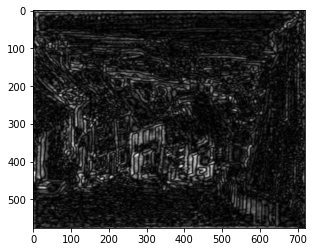

In [ ]:
nl, nc = img_noised.shape

D0 = 20
D1 = 80
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H = (D0 < z) & (z < D1)

filter_passe_bande = magnitude_spectrum * H

f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back = np.uint8(img_back)

plt.imshow(img_back,cmap='gray')

Conclusion : Le but de notre tp est déduire l'effet de chaque masque en appliquant différents filtres afin (d'améliorer l'aspect de l'image , le contraste , élimener les bruits , extraire les contours ...), et on a pu remarquer que chaque bruit est eliminé d'une manière plus plaisante et correcte avec  certains types de filtres.

*   
Concernant la dernière partie du tp : filtrage fréquentiel  qui consiste à filtrer une image en modifiant son spectre :  on applique donc le filtrage dans le domaine fréquentiel.
*   Le principe du filtrage est basé sur la TFD et la multipication par une fonction H ensuite une TFD inverse est appliquée 

*   Pour les filtres passe bande a pour objectif de laisser une bande de fréquences voulues.
*   Pour les filtres passe haut : il sert à couper les basses fréquences et donc d'accentuer les détails de l'image .






